<h1><center> Hospital Patient Survival Prediction using Machine Learning & Python  </center></h1>

# 1. Introduction
Data

Source: https://journals.lww.com/ccmjournal/Citation/2019/01001/33__THE_GLOBAL_OPEN_SOURCE_SEVERITY_OF_ILLNESS.36.aspx

In [301]:
# import required libraries for dataframe and visualization
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
sns.set_theme()
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [302]:
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 1000)
pd.set_option('display.width', 1000)

In [303]:
#LOADING DATASET:

dataset=pd.read_csv("dataset.csv")
dataset

,encounter_id,patient_id,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,heart_rate_apache,intubated_apache,map_apache,resprate_apache,temp_apache,ventilated_apache,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,d1_glucose_max,d1_glucose_min,d1_potassium_max,d1_potassium_min,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem,Unnamed: 83,hospital_death
0,93505,1,55,53.0,25.925926,0,Caucasian,M,180.0,Accident & Emergency,391,admit,CSICU,0.136806,84.0,114.0,102.01,0,0.0,1.0,1.0,0.0,1.0,128.0,1.0,55.0,45.0,32.10,1.0,108.0,49.0,108.0,49.0,136.0,62.0,115.0,57.0,115.0,57.0,34.0,7.0,100.0,80.0,140.0,73.0,140.0,73.0,38.3,32.10,74.0,49.0,74.0,49.0,136.0,102.0,85.0,57.0,85.0,57.0,28.0,22.0,100.0,80.0,118.0,73.0,118.0,73.0,520.0,83.0,4.6,2.7,0.83,0.78,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular,NaN,0
1,106180,2,182,37.0,51.752881,0,African American,F,152.4,Accident & Emergency,506,admit,MICU,0.071528,120.2,303.0,211.09,0,0.0,4.0,6.0,0.0,5.0,102.0,0.0,116.0,34.0,35.10,0.0,111.0,68.0,111.0,68.0,100.0,62.0,134.0,81.0,134.0,81.0,31.0,17.0,98.0,98.0,181.0,98.0,181.0,98.0,36.9,35.10,111.0,76.0,111.0,76.0,100.0,82.0,134.0,94.0,134.0,94.0,30.0,24.0,98.0,98.0,181.0,129.0,181.0,129.0,170.0,112.0,4.3,4.3,0.01,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory,NaN,0
2,53841,3,103,69.0,26.272919,0,NaN,M,167.6,Accident & Emergency,798,admit,Med-Surg ICU,0.073611,73.8,112.0,107.01,0,0.0,4.0,6.0,0.0,5.0,53.0,0.0,140.0,29.0,NaN,0.0,73.0,54.0,73.0,54.0,71.0,55.0,85.0,63.0,85.0,63.0,22.0,15.0,100.0,96.0,126.0,90.0,126.0,90.0,37.1,37.10,54.0,54.0,54.0,54.0,71.0,71.0,63.0,63.0,63.0,63.0,21.0,21.0,99.0,99.0,90.0,90.0,90.0,90.0,108.0,83.0,NaN,NaN,0.02,0.01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular,NaN,0
3,12193,4,70,58.0,29.208836,0,Caucasian,M,185.4,Accident & Emergency,434,transfer,MICU,0.079861,100.4,307.0,704.10,0,0.0,2.0,4.0,0.0,2.0,120.0,1.0,188.0,10.0,36.30,1.0,95.0,31.0,95.0,31.0,113.0,71.0,105.0,40.0,105.0,40.0,28.0,10.0,100.0,98.0,138.0,72.0,138.0,72.0,38.6,36.30,68.0,37.0,68.0,37.0,90.0,84.0,75.0,47.0,75.0,47.0,15.0,14.0,99.0,98.0,94.0,77.0,94.0,77.0,129.0,103.0,5.3,4.4,0.11,0.07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic,NaN,0
4,76221,5,70,77.0,20.601183,0,Caucasian,F,162.5,Accident & Emergency,464,admit,CCU-CTICU,0.090972,54.4,116.0,103.01,0,0.0,4.0,6.0,0.0,4.0,60.0,0.0,56.0,14.0,36.50,0.0,79.0,44.0,79.0,44.0,80.0,64.0,91.0,64.0,91.0,64.0,21.0,16.0,99.0,90.0,164.0,121.0,164.0,121.0,36.8,36.50,70.0,62.0,70.0,62.0,68.0,65.0,89.0,80.0,89.0,80.0,19.0,16.0,99.0,96.0,155.0,130.0,155.0,130.0,111.0,88.0,4.1,3.5,0.16,0.08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91708,

# 2. Exploratory Data Analysis

In [304]:
# shape
print("Data Size  :" ,dataset.size)
print("Data Shape :" ,dataset.shape)

Data Size  : 7795605
Data Shape : (91713, 85)


In [305]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91713 entries, 0 to 91712
Data columns (total 85 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   encounter_id                   91713 non-null  int64  
 1   patient_id                     91713 non-null  int64  
 2   hospital_id                    91713 non-null  int64  
 3   age                            87485 non-null  float64
 4   bmi                            88284 non-null  float64
 5   elective_surgery               91713 non-null  int64  
 6   ethnicity                      90318 non-null  object 
 7   gender                         91688 non-null  object 
 8   height                         90379 non-null  float64
 9   icu_admit_source               91601 non-null  object 
 10  icu_id                         91713 non-null  int64  
 11  icu_stay_type                  91713 non-null  object 
 12  icu_type                       91713 non-null 

In [306]:
# Count of columns
print("Total number of columns in the dataset: ",  len(dataset.columns))

Total number of columns in the dataset:  85


In [307]:
# column datatypes & it's Count
cols_int = dataset.columns[dataset.dtypes == 'int64'].tolist()
cols_float = dataset.columns[dataset.dtypes == 'float64'].tolist()
cols_object = dataset.columns[dataset.dtypes == 'object'].tolist()

print(" Number of integer columns    =", len(cols_int),
                 "\n Number of float columns      =", len(cols_float),
                 "\n Number of object columns     =",  len(cols_object))

 Number of integer columns    = 7 
 Number of float columns      = 71 
 Number of object columns     = 7


In [308]:
# Count of duplicate rows if any
print("Number of duplicate rows in the dataset : ", dataset.duplicated().sum())

Number of duplicate rows in the dataset :  0


In [309]:
# Missing data counts and percentage

missing = dataset.columns[dataset.isnull().any()].tolist()
# Printing all values of array without truncation

print('Missing Data Count \n---------------------------------------')
print('Column name                     Count \n---------------------------------------')
dataset[missing].isnull().sum().sort_values(ascending = False)

Missing Data Count 
---------------------------------------
Column name                     Count 
---------------------------------------


Unnamed: 83                      91713
d1_potassium_min                  9585
d1_potassium_max                  9585
h1_mbp_noninvasive_max            9084
h1_mbp_noninvasive_min            9084
apache_4a_icu_death_prob          7947
apache_4a_hospital_death_prob     7947
h1_diasbp_noninvasive_max         7350
h1_diasbp_noninvasive_min         7350
h1_sysbp_noninvasive_max          7341
h1_sysbp_noninvasive_min          7341
d1_glucose_max                    5807
d1_glucose_min                    5807
h1_mbp_min                        4639
h1_mbp_max                        4639
h1_resprate_min                   4357
h1_resprate_max                   4357
age                               4228
h1_spo2_max                       4185
h1_spo2_min                       4185
temp_apache                       4108
h1_diasbp_min                     3619
h1_diasbp_max                     3619
h1_sysbp_min                      3611
h1_sysbp_max                      3611
bmi                      

In [310]:
print('Missing Data Percentage \n--------------------------------------------')
print('Column name                     Percentage \n--------------------------------------------')
print(round(dataset[missing].isnull().sum().sort_values(ascending = False)/len(dataset)*100,2))

Missing Data Percentage 
--------------------------------------------
Column name                     Percentage 
--------------------------------------------
Unnamed: 83                      100.00
d1_potassium_min                  10.45
d1_potassium_max                  10.45
h1_mbp_noninvasive_max             9.90
h1_mbp_noninvasive_min             9.90
apache_4a_icu_death_prob           8.67
apache_4a_hospital_death_prob      8.67
h1_diasbp_noninvasive_max          8.01
h1_diasbp_noninvasive_min          8.01
h1_sysbp_noninvasive_max           8.00
h1_sysbp_noninvasive_min           8.00
d1_glucose_max                     6.33
d1_glucose_min                     6.33
h1_mbp_min                         5.06
h1_mbp_max                         5.06
h1_resprate_min                    4.75
h1_resprate_max                    4.75
age                                4.61
h1_spo2_max                        4.56
h1_spo2_min                        4.56
temp_apache                        4.48
h

In [311]:
# Statistical description of numerical variables in the dataset
summary_stats = dataset.describe()

# Round the summary statistics to 2 decimal places
summary_stats.round(1)


,encounter_id,patient_id,hospital_id,age,bmi,elective_surgery,height,icu_id,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,heart_rate_apache,intubated_apache,map_apache,resprate_apache,temp_apache,ventilated_apache,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,d1_glucose_max,d1_glucose_min,d1_potassium_max,d1_potassium_min,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,Unnamed: 83,hospital_death
count,91713.0,91713.0,91713.0,87485.0,88284.0,91713.0,90379.0,91713.0,91713.0,88993.0,90051.0,90612.0,91713.0,90998.0,89812.0,89812.0,90676.0,89812.0,90835.0,90998.0,90719.0,90479.0,87605.0,90998.0,91548.0,91548.0,90673.0,90673.0,91568.0,91568.0,91493.0,91493.0,90234.0,90234.0,91328.0,91328.0,91380.0,91380.0,91554.0,91554.0,90686.0,90686.0,89389.0,89389.0,88094.0,88094.0,84363.0,84363.0,88923.0,88923.0,87074.0,87074.0,82629.0,82629.0,87356.0,87356.0,87528.0,87528.0,88102.0,88102.0,84372.0,84372.0,85906.0,85906.0,82128.0,82128.0,83766.0,83766.0,90998.0,90998.0,90998.0,90998.0,90998.0,90998.0,90998.0,90998.0,0.0,91713.0
mean,65606.1,65537.1,105.7,62.3,29.2,0.2,169.6,508.4,0.8,84.0,185.4,558.2,0.2,0.0,3.5,5.5,0.0,4.0,99.7,0.2,88.0,25.8,36.4,0.3,88.5,50.2,88.6,50.2,103.0,70.3,104.7,64.9,104.6,64.9,28.9,12.8,99.2,90.5,148.3,96.9,148.2,97.0,37.3,36.3,75.4,62.8,75.8,63.3,92.2,83.7,91.6,79.4,91.6,79.7,22.6,17.2,98.0,95.2,133.2,116.4,133.1,116.5,174.6,114.4,4.3,3.9,0.1,0.0,0.0,0.0,0.2,0.0,0.0,0.0,0.0,0.0,NaN,0.1
std,37795.1,37811.3,62.9,16.8,8.3,0.4,10.8,229.0,2.5,25.0,86.1,463.3,0.4,0.2,1.0,1.3,0.1,1.6,30.9,0.4,42.0,15.1,0.8,0.5,19.8,13.3,19.8,13.3,22.0,17.1,20.8,15.7,20.7,15.7,10.7,5.1,1.8,10.0,25.7,20.7,25.8,20.7,0.7,0.7,18.4,16.4,18.5,16.4,21.8,20.3,20.5,19.1,20.6,19.2,7.5,6.1,3.2,6.6,27.6,26.5,27.7,26.6,86.7,38.3,0.7,0.6,0.2,0.2,0.0,0.1,0.4,0.1,0.2,0.1,0.1,0.1,NaN,0.3
min,1.0,1.0,2.0,16.0,14.8,0.0,137.2,82.0,-24.9,38.6,101.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,30.0,0.0,40.0,4.0,32.1,0.0,46.0,13.0,46.0,13.0,58.0,0.0,60.0,22.0,60.0,22.0,14.0,0.0,0.0,0.0,90.0,41.0,90.0,41.0,35.1,31.9,37.0,22.0,37.0,22.0,46.0,36.0,49.0,32.0,49.0,32.0,10.0,0.0,0.0,0.0,75.0,53.0,75.0,53.0,73.0,33.0,2.8,2.4,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0
25%,32852.0,32830.0,47.0,52.0,23.6,0.0,162.5,369.0,0.0,66.8,113.0,203.0,0.0,0.0,3.0,6.0,0.0,4.0,86.0,0.0,54.0,11.0,36.2,0.0,75.0,42.0,75.0,42.0,87.0,60.0,90.0,55.0,90.0,55.0,22.0,10.0,99.0,89.0,130.0,83.0,130.0,84.0,36.9,36.1,62.0,52.0,63.0,52.0,77.0,69.0,77.0,66.0,77.0,66.0,18.0,14.0,97.0,94.0,113.0,98.0,113.0,98.0,117.0,91.0,3.8,3.6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0
50%,65665.0,65413.0,109.0,65.0,27.7,0.0,170.1,504.0,0.1,80.3,122.0,409.0,0.0,0.0,4.0,6.0,0.0,5.0,104.0,0.0,67.0,28.0,36.5,0.0,86.0,50.0,87.0,50.0,101.0,69.0,102.0,64.0,102.0,64.0,26.0,13.0,100.0,92.0,146.0,96.0,146.0,96.0,37.1,36.4,74.0,62.0,74.0,62.0,90.0,82.0,90.0,78.0,90.0,79.0,21.0,16.0,99.0,96.0,131.0,115.0,130.0,115.0,150.0,107.0,4.2,3.9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0
75%,98342.0,98298.0,161.0,75.0,32.9,0.0,177.8,679.0,0.4,97.1,301.0,703.0,0.0,0.0,4.0,6.0,0.0,5.0,120.0,0.0,125.0,36.0,36.7,1.0,99.0,58.0,99.0,58.0,116.0,81.0,116.0,75.0,116.0,75.0,32.0,16.0,100.0,95.0,164.0,110.0,164.0,110.0,3

In [312]:
# Statistical description of categorical variables in the dataset
dataset.describe(include = ['O'])

,ethnicity,gender,icu_admit_source,icu_stay_type,icu_type,apache_3j_bodysystem,apache_2_bodysystem
count,90318,91688,91601,91713,91713,90051,90051
unique,6,2,5,3,8,11,10
top,Caucasian,M,Accident & Emergency,admit,Med-Surg ICU,Cardiovascular,Cardiovascular
freq,70684,49469,54060,86183,50586,29999,38816


In [313]:
# Dropping completely empty column
dataset.drop(['Unnamed: 83'], axis = 1, inplace = True)
dataset

,encounter_id,patient_id,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,heart_rate_apache,intubated_apache,map_apache,resprate_apache,temp_apache,ventilated_apache,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,d1_glucose_max,d1_glucose_min,d1_potassium_max,d1_potassium_min,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem,hospital_death
0,93505,1,55,53.0,25.925926,0,Caucasian,M,180.0,Accident & Emergency,391,admit,CSICU,0.136806,84.0,114.0,102.01,0,0.0,1.0,1.0,0.0,1.0,128.0,1.0,55.0,45.0,32.10,1.0,108.0,49.0,108.0,49.0,136.0,62.0,115.0,57.0,115.0,57.0,34.0,7.0,100.0,80.0,140.0,73.0,140.0,73.0,38.3,32.10,74.0,49.0,74.0,49.0,136.0,102.0,85.0,57.0,85.0,57.0,28.0,22.0,100.0,80.0,118.0,73.0,118.0,73.0,520.0,83.0,4.6,2.7,0.83,0.78,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular,0
1,106180,2,182,37.0,51.752881,0,African American,F,152.4,Accident & Emergency,506,admit,MICU,0.071528,120.2,303.0,211.09,0,0.0,4.0,6.0,0.0,5.0,102.0,0.0,116.0,34.0,35.10,0.0,111.0,68.0,111.0,68.0,100.0,62.0,134.0,81.0,134.0,81.0,31.0,17.0,98.0,98.0,181.0,98.0,181.0,98.0,36.9,35.10,111.0,76.0,111.0,76.0,100.0,82.0,134.0,94.0,134.0,94.0,30.0,24.0,98.0,98.0,181.0,129.0,181.0,129.0,170.0,112.0,4.3,4.3,0.01,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory,0
2,53841,3,103,69.0,26.272919,0,NaN,M,167.6,Accident & Emergency,798,admit,Med-Surg ICU,0.073611,73.8,112.0,107.01,0,0.0,4.0,6.0,0.0,5.0,53.0,0.0,140.0,29.0,NaN,0.0,73.0,54.0,73.0,54.0,71.0,55.0,85.0,63.0,85.0,63.0,22.0,15.0,100.0,96.0,126.0,90.0,126.0,90.0,37.1,37.10,54.0,54.0,54.0,54.0,71.0,71.0,63.0,63.0,63.0,63.0,21.0,21.0,99.0,99.0,90.0,90.0,90.0,90.0,108.0,83.0,NaN,NaN,0.02,0.01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular,0
3,12193,4,70,58.0,29.208836,0,Caucasian,M,185.4,Accident & Emergency,434,transfer,MICU,0.079861,100.4,307.0,704.10,0,0.0,2.0,4.0,0.0,2.0,120.0,1.0,188.0,10.0,36.30,1.0,95.0,31.0,95.0,31.0,113.0,71.0,105.0,40.0,105.0,40.0,28.0,10.0,100.0,98.0,138.0,72.0,138.0,72.0,38.6,36.30,68.0,37.0,68.0,37.0,90.0,84.0,75.0,47.0,75.0,47.0,15.0,14.0,99.0,98.0,94.0,77.0,94.0,77.0,129.0,103.0,5.3,4.4,0.11,0.07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic,0
4,76221,5,70,77.0,20.601183,0,Caucasian,F,162.5,Accident & Emergency,464,admit,CCU-CTICU,0.090972,54.4,116.0,103.01,0,0.0,4.0,6.0,0.0,4.0,60.0,0.0,56.0,14.0,36.50,0.0,79.0,44.0,79.0,44.0,80.0,64.0,91.0,64.0,91.0,64.0,21.0,16.0,99.0,90.0,164.0,121.0,164.0,121.0,36.8,36.50,70.0,62.0,70.0,62.0,68.0,65.0,89.0,80.0,89.0,80.0,19.0,16.0,99.0,96.0,155.0,130.0,155.0,130.0,111.0,88.0,4.1,3.5,0.16,0.08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91708,129406,131045,49,22.0,21.668411,1,Ca

##### Summary of the dataset --------------->>
- Number of observations -------------------                : $91713$
- Number of columns  ------------------------                    : $84$
- Number of integer columns----------------            : $7$
- Number of float columns ------------------               : $71$
- Number of object columns ----------------              : $7$
- Number of duplicate observations --------     : $0$
- Number of columns with missing values---  : $75$

#### Columns with most missing values
- d1_potassium_min  ------------------------               9585
- d1_potassium_max ------------------------                9585
- h1_mbp_noninvasive_max ----------------           9084
- 1_mbp_noninvasive_min ------------------           9084
- apache_4a_icu_death_prob ---------------         7947
- apache_4a_hospital_death_prob ----------   7947
- h1_diasbp_noninvasive_max --------------        7350
- h1_diasbp_noninvasive_min --------------        7350
- h1_sysbp_noninvasive_max  --------------        7341
- h1_sysbp_noninvasive_min  --------------        7341


### Univariate Analysis

The target variable hospital_death is a binary variable indicating the survival status of a patient.
- 0↦patient SURVIVED
- 1↦patient DIED

In [314]:
# Value Counts for Patients who have passed away
dataset['hospital_death'].value_counts()

0    83798
1     7915
Name: hospital_death, dtype: int64

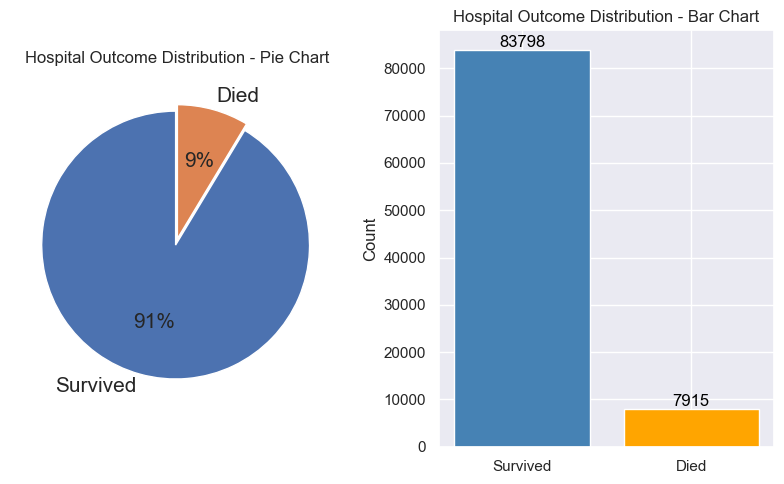

In [315]:
fig, axes = plt.subplots(ncols=2, figsize=(8, 5))

# Pie chart for 'hospital_death'
counts = dataset['hospital_death'].value_counts()
labels = ['Survived', 'Died']

# Create a pie chart
axes[0].pie(counts, labels=labels, autopct='%.0f%%', startangle=90, explode=[0.05, 0], textprops={'fontsize': 15})
axes[0].set_title('Hospital Outcome Distribution - Pie Chart')

# Bar chart for 'hospital_death'
axes[1].bar(labels, counts, color=['steelblue', 'orange'])

# Add data labels on each bar
for i, count in enumerate(counts):
    axes[1].text(i, count + 50, str(count), ha='center', va='bottom', fontsize=12, color='black')

axes[1].set_title('Hospital Outcome Distribution - Bar Chart')

# Set axis labels for the bar chart
axes[1].set_ylabel('Count')

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()


Filling missing values and cleaning the data

In [316]:
# Impute missing values in numerical columns with their median
numerical_columns = dataset.select_dtypes(include=['int64', 'float64']).columns
dataset[numerical_columns] = dataset[numerical_columns].fillna(dataset[numerical_columns].median())

# Impute missing values in categorical columns with their mode
categorical_columns = dataset.select_dtypes(include=['object']).columns
dataset[categorical_columns] = dataset[categorical_columns].fillna(dataset[categorical_columns].mode().iloc[0])


In [317]:
# Missing data counts and percentage

missing1 = dataset.columns[dataset.isnull().any()].tolist()
# Printing all values of array without truncation

print('Missing Data Count \n---------------------------------------')
print('Column name                     Count \n---------------------------------------')
dataset[missing1].isnull().sum().sort_values(ascending = False)

Missing Data Count 
---------------------------------------
Column name                     Count 
---------------------------------------


Series([], dtype: float64)

## No missing values

In [318]:
# Correlation Analysis:
dataset.corr()[['hospital_death']].sort_values(['hospital_death'], ascending = False)

,hospital_death
hospital_death,1.000000
d1_resprate_min,0.005797
gcs_motor_apache,0.004917
gcs_verbal_apache,0.004418
gcs_eyes_apache,0.004084
map_apache,0.003438
h1_diasbp_noninvasive_max,0.003220
gcs_unable_apache,0.002587
d1_heartrate_max,0.002558
h1_mbp_noninvasive_max,0.002227


In [319]:
from scipy.stats import chi2_contingency
print( "p-value \n")

categorical_columns = dataset.select_dtypes(include=['object']).columns
for col in categorical_columns:
    contingency_table = pd.crosstab(dataset[col], dataset['hospital_death'])
    chi2, p, _, _ = chi2_contingency(contingency_table)
    print(f"{col}:  {p:.3f}")


p-value 

ethnicity:  0.533
gender:  0.151
icu_admit_source:  0.619
icu_stay_type:  0.517
icu_type:  0.623
apache_3j_bodysystem:  0.304
apache_2_bodysystem:  0.218


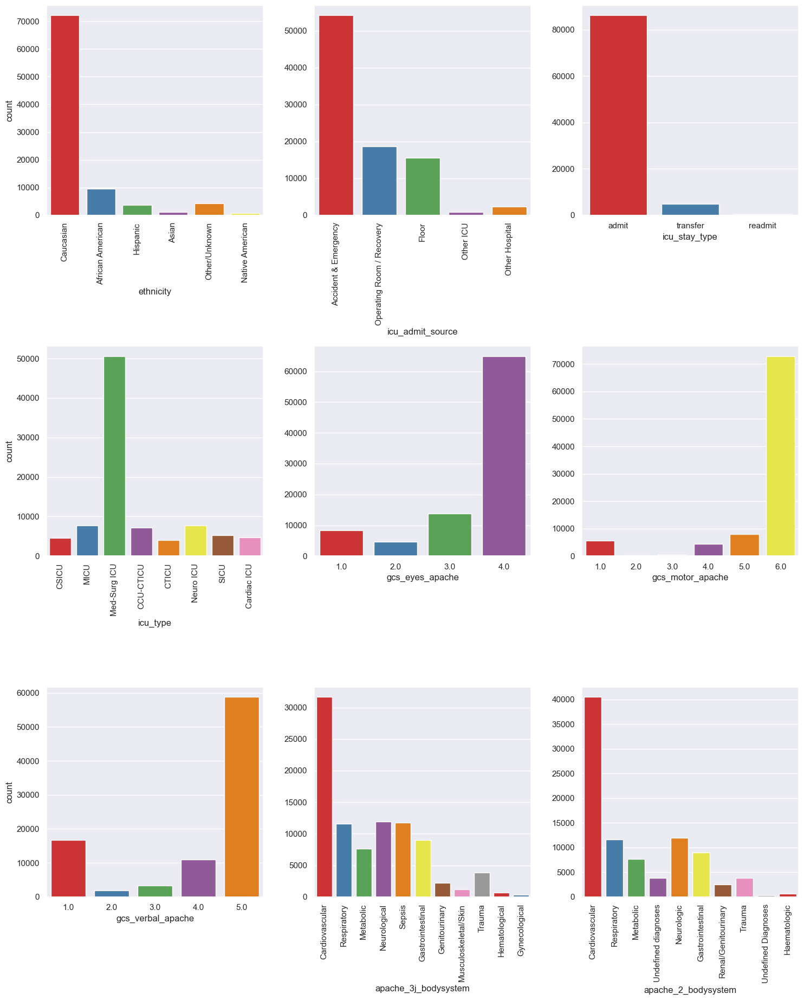

In [320]:
import math
# Columns with 4 to 15 distinct values
cols_selected = [col for col in dataset.columns if 2 < dataset[col].nunique() <= 15]
col_vert = ['ethnicity', 'hospital_admit_source', 'icu_admit_source', 'icu_type','apache_3j_bodysystem', 'apache_2_bodysystem']
nrows = math.ceil(len(cols_selected)/3)
fig, ax = plt.subplots(nrows, 3, figsize = (15, 6.2*nrows), sharey = False)
for i in range(len(cols_selected)):
    countplot = sns.countplot(data = dataset, x = cols_selected[i], ax = ax[i//3, i%3], palette='Set1')
    if cols_selected[i] in col_vert:
        countplot.set_xticklabels(countplot.get_xticklabels(), rotation = 90)
    if i%3 != 0:
        ax[i//3, i%3].set_ylabel(" ")

plt.tight_layout()

plt.show()

In [321]:
# Histograms in grid
def distribution_plot(df, cols, ncols = 4, kind = 'hist', hue = None, height = 0.84*4, width = 4):
    cols = [col for col in df.columns if df[col].nunique() > 15 and df[col].dtype == 'float64']
    bins_fd = math.floor(len(df)**(1/3))
    nrows = math.ceil(len(cols)/ncols)
    if kind == 'hist':
        fig, ax = plt.subplots(nrows, ncols, figsize = (width*ncols, height*nrows), sharey = False)
        for i in range(len(cols)):
            sns.histplot(data = df, x = cols[i], bins = bins_fd, hue = hue, ax = ax[i // ncols, i % ncols],color="purple")
            if i % ncols != 0:
                ax[i // ncols, i % ncols].set_ylabel(" ")
    elif kind == 'kde':
        fig, ax = plt.subplots(nrows, ncols, figsize = (width*ncols, height*nrows), sharey = False)
        for i in range(len(cols)):
            sns.kdeplot(data = df, x = cols[i], hue = hue, ax = ax[i // ncols, i % ncols])
            if i % ncols != 0:
                ax[i // ncols, i % ncols].set_ylabel(" ")
    else:
        raise TypeError(f"'{kind}' is not a valid argument for the parameter kind. Use 'hist' or 'kde'.")
    plt.tight_layout()
    plt.show()

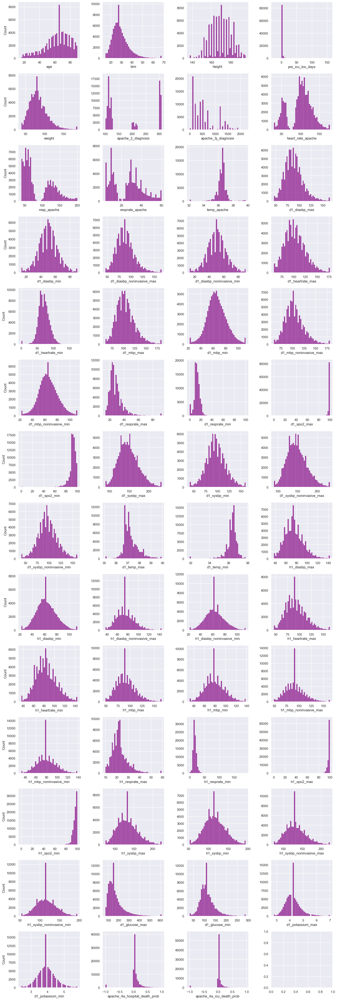

In [322]:
# Float columns with more than 15 distinct values
cols_selected = [col for col in dataset.columns if dataset[col].nunique() > 15 and dataset[col].dtype == 'float64']
distribution_plot(df = dataset, cols = cols_selected, kind = 'hist')

In [323]:
# Heatmap
cols_selected = [col for col in cols_int + cols_float if col != 'hospital_death']
plt.figure(figsize = (100, 100))
sns.heatmap(dataset.corr(), annot = True, cmap = plt.cm.PRGn)

<Axes: >

Text(0.5, 1.0, 'Correlation Heatmap')

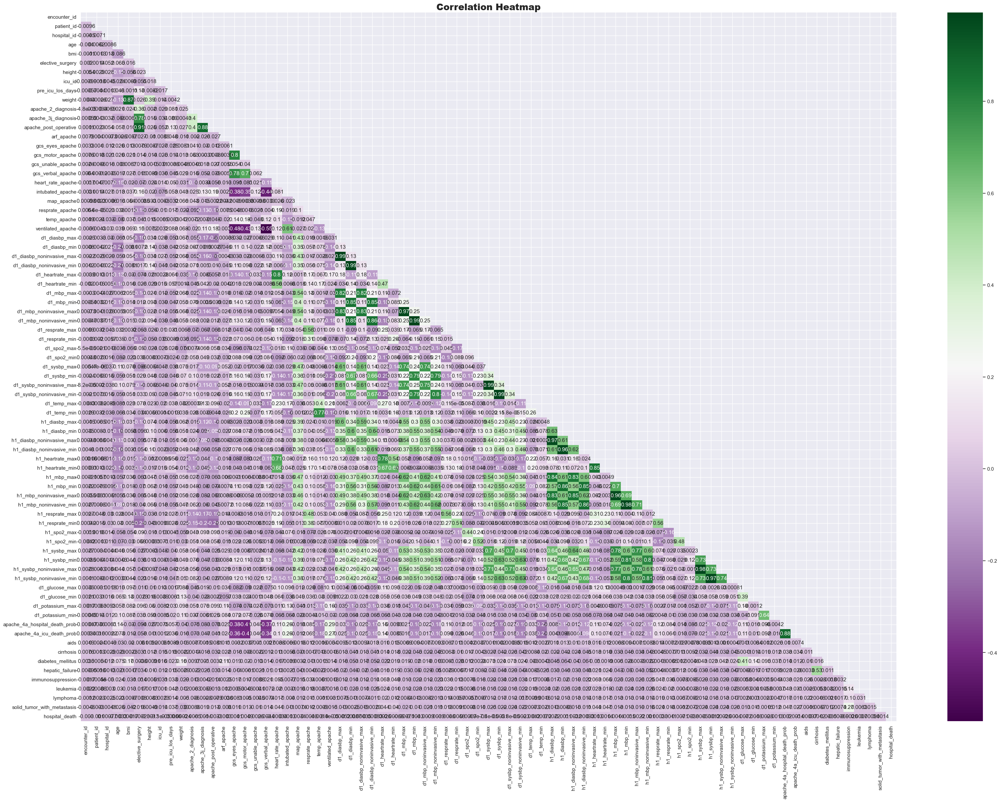

In [324]:

# Checking corelations
plt.figure(figsize=(40, 28))
mask = np.triu(np.ones_like(dataset.corr()))
heatmap = sns.heatmap(dataset.corr(), mask = mask, annot=True, cmap='PRGn')
heatmap.set_title("Correlation Heatmap", size = 20, weight = 'heavy')

In [325]:
# Contingency tables for target variable and binary features
def contingency_binary(df, target, ncols = 3, figsize_multiplier = 2):
    cols_binary = [col for col in df.columns if df[col].nunique() == 2]
    cols_binary.remove(target)
    if len(cols_binary) == 0:
        print("The dataset does not contain a binary feature")
    else:
        nrows = math.ceil(len(cols_binary)/ncols)
        nvals = 2 # Binary variables
        figsize = (figsize_multiplier*nvals*ncols, 0.8*figsize_multiplier*nvals*nrows)
        fig, ax = plt.subplots(nrows, ncols, figsize = figsize, sharey = False)
        class_names_2 = df[target].value_counts().index.tolist()
        for i in range(len(cols_binary)):
            class_names_1 = df[cols_binary[i]].value_counts().index.tolist()
            contingency_mat = np.zeros(shape = (len(class_names_2), len(class_names_1)))
            for j in range(len(class_names_2)):
                for k in range(len(class_names_1)):
                    contingency_mat[j][k] = len([l for l in range(len(df)) if df[target][l] == class_names_2[j] and df[cols_binary[i]][l] == class_names_1[k]])
            contingency_table_df = pd.DataFrame(contingency_mat)
            hm = sns.heatmap(contingency_table_df, annot = True, annot_kws = {"size": 16}, fmt = 'g', ax = ax[i // ncols, i % ncols],cmap='coolwarm' )
            hm.set_xlabel(f'{cols_binary[i]}', fontsize = 14)
            hm.set_ylabel(target, fontsize = 14)
            hm.set_xticklabels(class_names_1, fontdict = {'fontsize': 12}, rotation = 0, ha = "right")
            hm.set_yticklabels(class_names_2, fontdict = {'fontsize': 12}, rotation = 0, ha = "right")
            if i % ncols != 0:
                ax[i // ncols, i % ncols].set_ylabel(" ")
        plt.tight_layout()
        plt.show()

In [326]:
# Contingency table for target variable and general categorical feature
def contingency_table(df, feature, target, figsize_multiplier = 2, title = False, rotate_xticklabels = 0, rotate_yticklabels = 0):
    class_names_1 = df[feature].value_counts().index.tolist()
    class_names_2 = df[target].value_counts().index.tolist()

    contingency_mat = np.zeros(shape = (len(class_names_2), len(class_names_1)))
    for i in range(len(class_names_2)):
        for j in range(len(class_names_1)):
            contingency_mat[i][j] = len([k for k in range(len(df)) if df[target][k] == class_names_2[i] and df[feature][k] == class_names_1[j]])

    contingency_table_df = pd.DataFrame(contingency_mat)
    plt.figure(figsize = (figsize_multiplier*len(class_names_1), 0.8*figsize_multiplier*len(class_names_2)))
    if title == True:
        plt.title(f"{target} x {feature}")
    hm = sns.heatmap(contingency_table_df, annot = True, annot_kws = {"size": 16}, fmt = 'g', cmap='coolwarm')
    hm.set_xlabel(f'{feature}', fontsize = 14)
    hm.set_ylabel(f'{target}', fontsize = 14)
    hm.set_xticklabels(class_names_1, fontdict = {'fontsize': 12}, rotation = rotate_xticklabels, ha = "right")
    hm.set_yticklabels(class_names_2, fontdict = {'fontsize': 12}, rotation = rotate_yticklabels, ha = "right")
    plt.grid(False)
    plt.show()

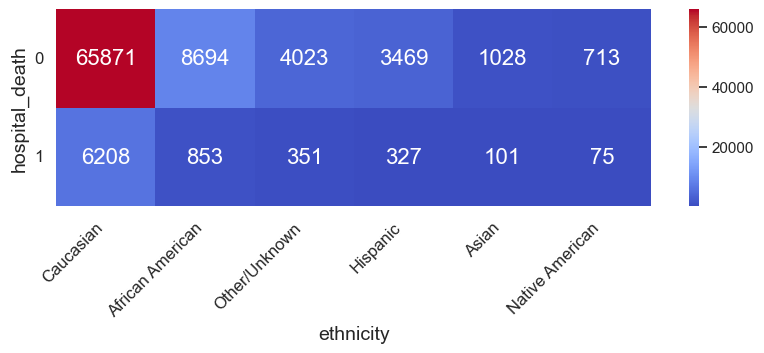

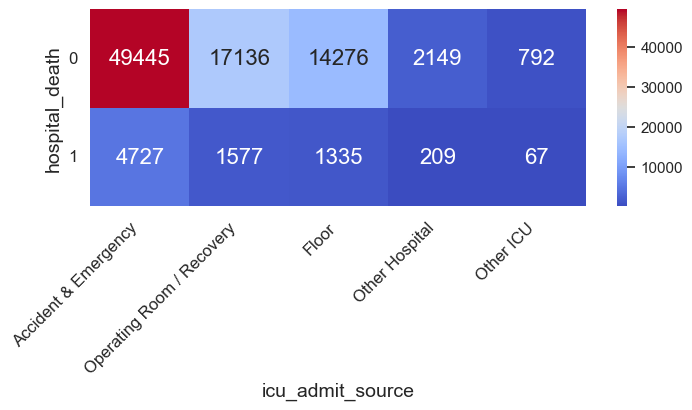

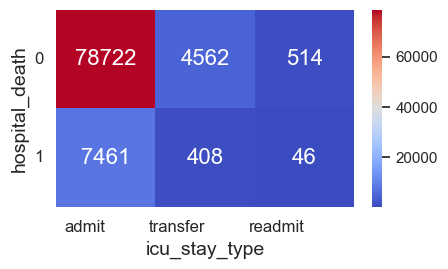

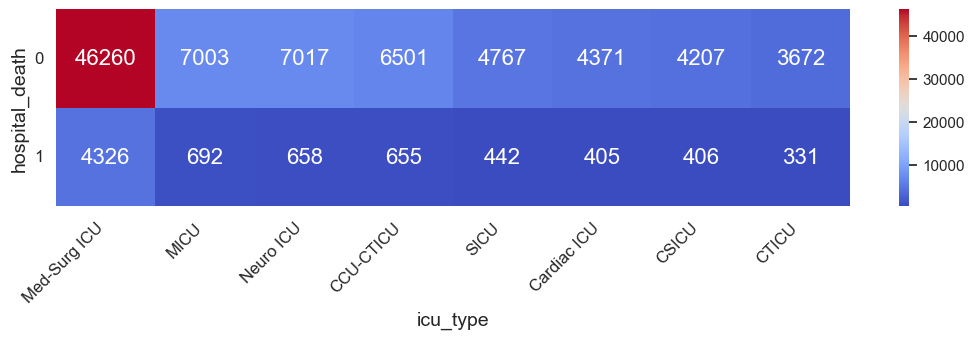

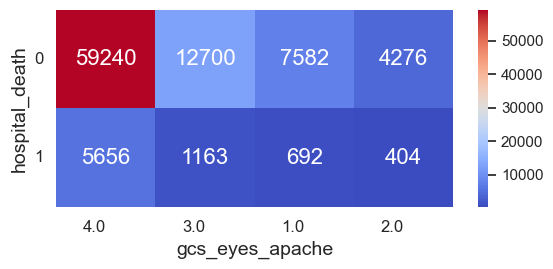

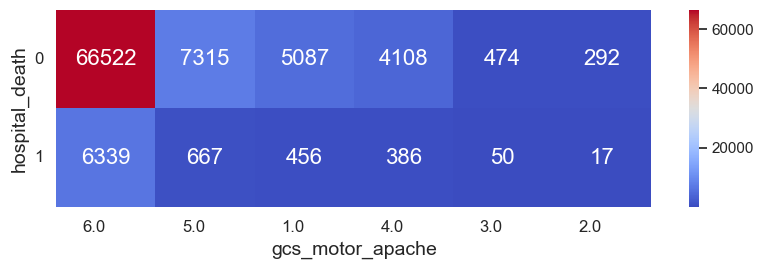

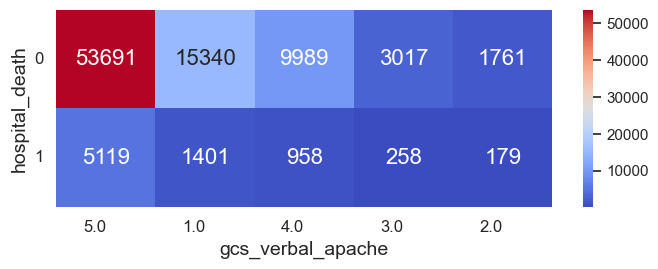

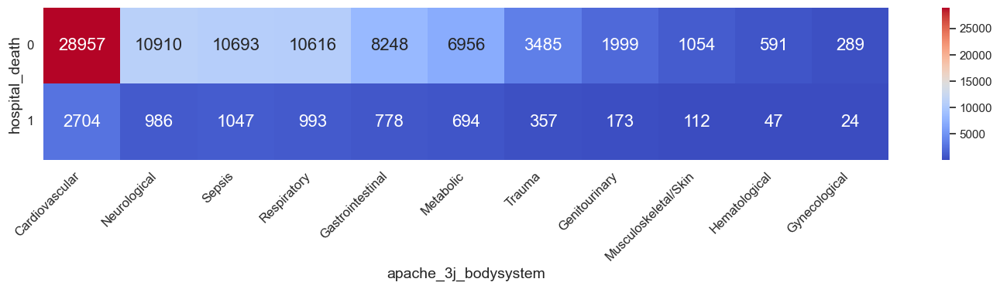

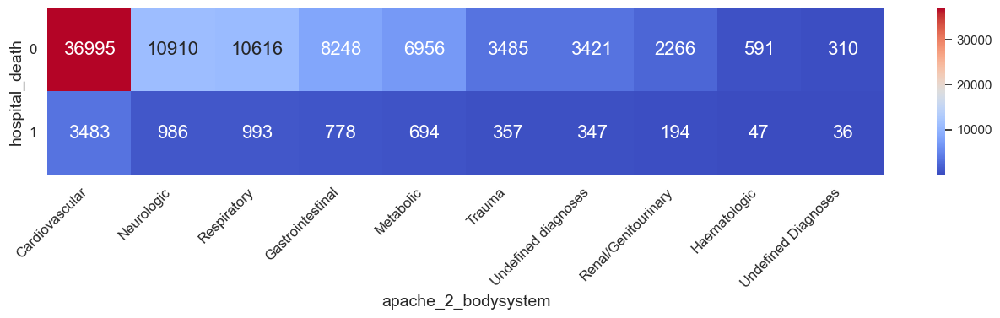

In [327]:
# Target x Features taking 3 to 15 distinct values
cols_selected = [col for col in dataset.columns if 3 <= dataset[col].nunique() <= 15]
cols_xticklabels = ['ethnicity', 'hospital_admit_source', 'icu_admit_source', 'icu_type', 'apache_3j_bodysystem', 'apache_2_bodysystem']
for col in cols_selected:
    if col in cols_xticklabels:
        rotate_xticklabels = 45
    else:
        rotate_xticklabels = 0
    contingency_table(df = dataset, feature = col, target = 'hospital_death', figsize_multiplier = 1.6, rotate_xticklabels = rotate_xticklabels)

In [328]:
# Dropping irrevalent columns 
dataset.drop(['encounter_id', 'hospital_id', 'icu_id' ], axis = 1, inplace = True)
dataset

,patient_id,age,bmi,elective_surgery,ethnicity,gender,height,icu_admit_source,icu_stay_type,icu_type,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,heart_rate_apache,intubated_apache,map_apache,resprate_apache,temp_apache,ventilated_apache,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,d1_glucose_max,d1_glucose_min,d1_potassium_max,d1_potassium_min,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem,hospital_death
0,1,53.0,25.925926,0,Caucasian,M,180.0,Accident & Emergency,admit,CSICU,0.136806,84.0,114.0,102.01,0,0.0,1.0,1.0,0.0,1.0,128.0,1.0,55.0,45.0,32.10,1.0,108.0,49.0,108.0,49.0,136.0,62.0,115.0,57.0,115.0,57.0,34.0,7.0,100.0,80.0,140.0,73.0,140.0,73.0,38.3,32.10,74.0,49.0,74.0,49.0,136.0,102.0,85.0,57.0,85.0,57.0,28.0,22.0,100.0,80.0,118.0,73.0,118.0,73.0,520.0,83.0,4.6,2.7,0.83,0.78,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular,0
1,2,37.0,51.752881,0,African American,F,152.4,Accident & Emergency,admit,MICU,0.071528,120.2,303.0,211.09,0,0.0,4.0,6.0,0.0,5.0,102.0,0.0,116.0,34.0,35.10,0.0,111.0,68.0,111.0,68.0,100.0,62.0,134.0,81.0,134.0,81.0,31.0,17.0,98.0,98.0,181.0,98.0,181.0,98.0,36.9,35.10,111.0,76.0,111.0,76.0,100.0,82.0,134.0,94.0,134.0,94.0,30.0,24.0,98.0,98.0,181.0,129.0,181.0,129.0,170.0,112.0,4.3,4.3,0.01,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory,0
2,3,69.0,26.272919,0,Caucasian,M,167.6,Accident & Emergency,admit,Med-Surg ICU,0.073611,73.8,112.0,107.01,0,0.0,4.0,6.0,0.0,5.0,53.0,0.0,140.0,29.0,36.50,0.0,73.0,54.0,73.0,54.0,71.0,55.0,85.0,63.0,85.0,63.0,22.0,15.0,100.0,96.0,126.0,90.0,126.0,90.0,37.1,37.10,54.0,54.0,54.0,54.0,71.0,71.0,63.0,63.0,63.0,63.0,21.0,21.0,99.0,99.0,90.0,90.0,90.0,90.0,108.0,83.0,4.2,3.9,0.02,0.01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular,0
3,4,58.0,29.208836,0,Caucasian,M,185.4,Accident & Emergency,transfer,MICU,0.079861,100.4,307.0,704.10,0,0.0,2.0,4.0,0.0,2.0,120.0,1.0,188.0,10.0,36.30,1.0,95.0,31.0,95.0,31.0,113.0,71.0,105.0,40.0,105.0,40.0,28.0,10.0,100.0,98.0,138.0,72.0,138.0,72.0,38.6,36.30,68.0,37.0,68.0,37.0,90.0,84.0,75.0,47.0,75.0,47.0,15.0,14.0,99.0,98.0,94.0,77.0,94.0,77.0,129.0,103.0,5.3,4.4,0.11,0.07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic,0
4,5,77.0,20.601183,0,Caucasian,F,162.5,Accident & Emergency,admit,CCU-CTICU,0.090972,54.4,116.0,103.01,0,0.0,4.0,6.0,0.0,4.0,60.0,0.0,56.0,14.0,36.50,0.0,79.0,44.0,79.0,44.0,80.0,64.0,91.0,64.0,91.0,64.0,21.0,16.0,99.0,90.0,164.0,121.0,164.0,121.0,36.8,36.50,70.0,62.0,70.0,62.0,68.0,65.0,89.0,80.0,89.0,80.0,19.0,16.0,99.0,96.0,155.0,130.0,155.0,130.0,111.0,88.0,4.1,3.5,0.16,0.08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91708,131045,22.0,21.668411,1,Caucasian,F,177.8,Operating Room / Recovery,admit,Med-Surg ICU,0.085417,68.5,305.0,1802.01,1,0.0,4.0,6.0,0.0,5.0,141

In [331]:
df= dataset.copy()
df.head()

,patient_id,age,bmi,elective_surgery,ethnicity,gender,height,icu_admit_source,icu_stay_type,icu_type,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,heart_rate_apache,intubated_apache,map_apache,resprate_apache,temp_apache,ventilated_apache,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,d1_glucose_max,d1_glucose_min,d1_potassium_max,d1_potassium_min,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem,hospital_death
0,1,53.0,25.925926,0,Caucasian,M,180.0,Accident & Emergency,admit,CSICU,0.136806,84.0,114.0,102.01,0,0.0,1.0,1.0,0.0,1.0,128.0,1.0,55.0,45.0,32.1,1.0,108.0,49.0,108.0,49.0,136.0,62.0,115.0,57.0,115.0,57.0,34.0,7.0,100.0,80.0,140.0,73.0,140.0,73.0,38.3,32.1,74.0,49.0,74.0,49.0,136.0,102.0,85.0,57.0,85.0,57.0,28.0,22.0,100.0,80.0,118.0,73.0,118.0,73.0,520.0,83.0,4.6,2.7,0.83,0.78,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular,0
1,2,37.0,51.752881,0,African American,F,152.4,Accident & Emergency,admit,MICU,0.071528,120.2,303.0,211.09,0,0.0,4.0,6.0,0.0,5.0,102.0,0.0,116.0,34.0,35.1,0.0,111.0,68.0,111.0,68.0,100.0,62.0,134.0,81.0,134.0,81.0,31.0,17.0,98.0,98.0,181.0,98.0,181.0,98.0,36.9,35.1,111.0,76.0,111.0,76.0,100.0,82.0,134.0,94.0,134.0,94.0,30.0,24.0,98.0,98.0,181.0,129.0,181.0,129.0,170.0,112.0,4.3,4.3,0.01,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory,0
2,3,69.0,26.272919,0,Caucasian,M,167.6,Accident & Emergency,admit,Med-Surg ICU,0.073611,73.8,112.0,107.01,0,0.0,4.0,6.0,0.0,5.0,53.0,0.0,140.0,29.0,36.5,0.0,73.0,54.0,73.0,54.0,71.0,55.0,85.0,63.0,85.0,63.0,22.0,15.0,100.0,96.0,126.0,90.0,126.0,90.0,37.1,37.1,54.0,54.0,54.0,54.0,71.0,71.0,63.0,63.0,63.0,63.0,21.0,21.0,99.0,99.0,90.0,90.0,90.0,90.0,108.0,83.0,4.2,3.9,0.02,0.01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular,0
3,4,58.0,29.208836,0,Caucasian,M,185.4,Accident & Emergency,transfer,MICU,0.079861,100.4,307.0,704.10,0,0.0,2.0,4.0,0.0,2.0,120.0,1.0,188.0,10.0,36.3,1.0,95.0,31.0,95.0,31.0,113.0,71.0,105.0,40.0,105.0,40.0,28.0,10.0,100.0,98.0,138.0,72.0,138.0,72.0,38.6,36.3,68.0,37.0,68.0,37.0,90.0,84.0,75.0,47.0,75.0,47.0,15.0,14.0,99.0,98.0,94.0,77.0,94.0,77.0,129.0,103.0,5.3,4.4,0.11,0.07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic,0
4,5,77.0,20.601183,0,Caucasian,F,162.5,Accident & Emergency,admit,CCU-CTICU,0.090972,54.4,116.0,103.01,0,0.0,4.0,6.0,0.0,4.0,60.0,0.0,56.0,14.0,36.5,0.0,79.0,44.0,79.0,44.0,80.0,64.0,91.0,64.0,91.0,64.0,21.0,16.0,99.0,90.0,164.0,121.0,164.0,121.0,36.8,36.5,70.0,62.0,70.0,62.0,68.0,65.0,89.0,80.0,89.0,80.0,19.0,16.0,99.0,96.0,155.0,130.0,155.0,130.0,111.0,88.0,4.1,3.5,0.16,0.08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular,0


In [332]:
from sklearn.preprocessing import LabelEncoder


# Initialize the LabelEncoder
label_encoder = LabelEncoder()

# Apply label encoding to selected columns
for column in df:
    if column in df.columns and df[column].dtype == 'object':
        df_new[column] = label_encoder.fit_transform(df[column])

# Display the modified DataFrame
df_new.head(10)


,patient_id,age,bmi,elective_surgery,ethnicity,gender,height,icu_admit_source,icu_stay_type,icu_type,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,heart_rate_apache,intubated_apache,map_apache,resprate_apache,temp_apache,ventilated_apache,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,d1_glucose_max,d1_glucose_min,d1_potassium_max,d1_potassium_min,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem,hospital_death
0,1,53.0,25.925926,0,2,1,180.0,0,0,1,0.136806,84.0,114.0,102.01,0,0.0,1.0,1.0,0.0,1.0,128.0,1.0,55.0,45.0,32.1,1.0,108.0,49.0,108.0,49.0,136.0,62.0,115.0,57.0,115.0,57.0,34.0,7.0,100.0,80.0,140.0,73.0,140.0,73.0,38.3,32.1,74.0,49.0,74.0,49.0,136.0,102.0,85.0,57.0,85.0,57.0,28.0,22.0,100.0,80.0,118.0,73.0,118.0,73.0,520.0,83.0,4.6,2.7,0.83,0.78,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
1,2,37.0,51.752881,0,0,0,152.4,0,0,4,0.071528,120.2,303.0,211.09,0,0.0,4.0,6.0,0.0,5.0,102.0,0.0,116.0,34.0,35.1,0.0,111.0,68.0,111.0,68.0,100.0,62.0,134.0,81.0,134.0,81.0,31.0,17.0,98.0,98.0,181.0,98.0,181.0,98.0,36.9,35.1,111.0,76.0,111.0,76.0,100.0,82.0,134.0,94.0,134.0,94.0,30.0,24.0,98.0,98.0,181.0,129.0,181.0,129.0,170.0,112.0,4.3,4.3,0.01,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8,6,0
2,3,69.0,26.272919,0,2,1,167.6,0,0,5,0.073611,73.8,112.0,107.01,0,0.0,4.0,6.0,0.0,5.0,53.0,0.0,140.0,29.0,36.5,0.0,73.0,54.0,73.0,54.0,71.0,55.0,85.0,63.0,85.0,63.0,22.0,15.0,100.0,96.0,126.0,90.0,126.0,90.0,37.1,37.1,54.0,54.0,54.0,54.0,71.0,71.0,63.0,63.0,63.0,63.0,21.0,21.0,99.0,99.0,90.0,90.0,90.0,90.0,108.0,83.0,4.2,3.9,0.02,0.01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
3,4,58.0,29.208836,0,2,1,185.4,0,2,4,0.079861,100.4,307.0,704.10,0,0.0,2.0,4.0,0.0,2.0,120.0,1.0,188.0,10.0,36.3,1.0,95.0,31.0,95.0,31.0,113.0,71.0,105.0,40.0,105.0,40.0,28.0,10.0,100.0,98.0,138.0,72.0,138.0,72.0,38.6,36.3,68.0,37.0,68.0,37.0,90.0,84.0,75.0,47.0,75.0,47.0,15.0,14.0,99.0,98.0,94.0,77.0,94.0,77.0,129.0,103.0,5.3,4.4,0.11,0.07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5,3,0
4,5,77.0,20.601183,0,2,0,162.5,0,0,0,0.090972,54.4,116.0,103.01,0,0.0,4.0,6.0,0.0,4.0,60.0,0.0,56.0,14.0,36.5,0.0,79.0,44.0,79.0,44.0,80.0,64.0,91.0,64.0,91.0,64.0,21.0,16.0,99.0,90.0,164.0,121.0,164.0,121.0,36.8,36.5,70.0,62.0,70.0,62.0,68.0,65.0,89.0,80.0,89.0,80.0,19.0,16.0,99.0,96.0,155.0,130.0,155.0,130.0,111.0,88.0,4.1,3.5,0.16,0.08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
5,6,65.0,23.470015,1,2,1,172.7,2,0,2,0.012500,70.0,308.0,1207.01,1,0.0,4.0,6.0,0.0,5.0,106.0,0.0,68.0,5.0,36.4,0.0,62.0,54.0,62.0,54.0,106.0,72.0,72.0,72.0,72.0,72.0,27.0,5.0,99.0,94.0,104.0,100.0,104.0,100.0,36.8,35.5,56.0,52.0,74.0,62.0,82.0,78.0,82.0,64.0,90.0,79.0,16.0,5.0,95.0,94.0,122.0,100.0,130.0,115.0,129.0,98.0,4.6,3.9,0.01,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,9,0
6,7,66.0,24.408815,0,0,1,172.7,2,0,2,0.253472,72.8,302.0,1208.10,1,0.0,4.0,6.0,0.0,5.0,44.0,0.0,141.0,38.0,35.5,0.0,104.0,59.0,104.0,59.0,86.0,44.0,141.0,69.0,141.0,69.0,38.0,4.0,99.0,92.0,171.0,97.0,171.0,97.0,35.9,35.5,82.0,73.0,82.0,73.0,52.0,46.0,97.0,84.0,97.0,84.0,24.0,14.0,99.0,97.0,136.0,108.0,136.0,108.0,149.0,149.0,3.7,3.7,0.01,0.01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
7,8,80.0,30.851890,0,2,1,175.2

In [336]:
df_new.shape

(91713, 81)

# MODEL BUILDING 

In [334]:
#extracting features(x= independent variables) and y =target(dependent variables):

In [345]:
x=df_new.iloc[:, 1:80].values
x

array([[53.        , 25.92592593,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [37.        , 51.75288128,  0.        , ...,  0.        ,
         8.        ,  6.        ],
       [69.        , 26.27291938,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [32.        , 23.5546875 ,  0.        , ...,  0.        ,
         7.        ,  4.        ],
       [71.        , 40.27269284,  0.        , ...,  0.        ,
         4.        ,  2.        ],
       [54.        , 36.61309098,  0.        , ...,  0.        ,
         9.        ,  0.        ]])

In [346]:
y=df_new.iloc[:, 80].values
y

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [347]:
y.shape

(91713,)

In [348]:
#SPLITTING INTO TRAIN AND TEST SETS:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.3,random_state=42)

In [349]:
#fitting logistic regression to the training set:

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score #to check how well our model is

log_reg=LogisticRegression()
log_reg.fit(x_train,y_train)

LogisticRegression()

In [350]:
#predicting and checking accuracy of train data:
x_train_prediction=log_reg.predict(x_train)

training_data_accuracy_lr=accuracy_score(x_train_prediction,y_train)
print("ACCURACY OF TRAIN DATA : " , training_data_accuracy_lr*100 , "%")

ACCURACY OF TRAIN DATA :  91.35344787301983 %


In [351]:
#predicting and checking accuracy of test data:
x_test_prediction=log_reg.predict(x_test)

test_data_accuracy_lr=accuracy_score(x_test_prediction,y_test)
print("ACCURACY OF TEST DATA : " , test_data_accuracy_lr*100 , "%")

ACCURACY OF TEST DATA :  91.40801046739841 %


[[58648  5551]
 [    0     0]]


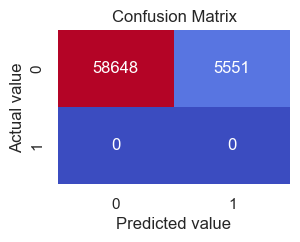

In [356]:
#Model Evaluation
from sklearn.metrics import accuracy_score,confusion_matrix
conf_matrix=confusion_matrix(x_train_prediction,y_train)
print(conf_matrix)

plt.figure(figsize=(3,2))
sns.heatmap(conf_matrix,annot=True,fmt="d",cbar=False, cmap='coolwarm')
plt.xlabel("Predicted value")
plt.ylabel("Actual value")
plt.title("Confusion Matrix")
plt.show()

3. DECISION TREE

In [357]:
#splitting dataset into training and test sets:

from sklearn.model_selection import train_test_split

x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=0)

In [358]:
#fitting decision tree model to the training set:

from sklearn.tree import DecisionTreeClassifier

classifier=DecisionTreeClassifier(criterion="entropy" , random_state=0)

classifier.fit(x_train,y_train)

DecisionTreeClassifier(criterion='entropy', random_state=0)

In [359]:
#predicting result:

y_pred=classifier.predict(x_test)

In [366]:
#creating confusion matrix:

cm=confusion_matrix(y_test,y_pred)
cm

array([[15068,  1604],
       [ 1521,   150]], dtype=int64)

Text(0.5, -10.750000000000004, 'PREDICTED VALUES')

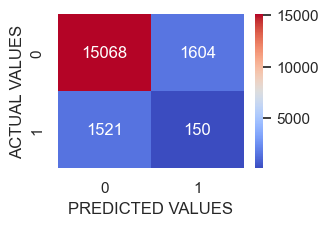

In [369]:
plt.figure(figsize=(3,2))
sns.heatmap(cm, annot=True, fmt = 'd', cmap='coolwarm')

plt.ylabel("ACTUAL VALUES")
plt.xlabel("PREDICTED VALUES")

In [370]:
#splitting dataset into training and test sets:

from sklearn.model_selection import train_test_split

x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=4)

In [371]:
#fitting random forest to the training set:

from sklearn.ensemble import RandomForestClassifier

classifier=RandomForestClassifier(random_state=100)

classifier.fit(x_train,y_train)

RandomForestClassifier(random_state=100)

In [375]:
#predicting result:

y_pred=classifier.predict(x_test)

Text(0.5, -10.750000000000004, 'PREDICTED VALUES')

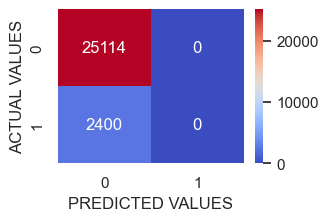

In [376]:
#creating confusion matrix:

from sklearn.metrics import confusion_matrix

cm=confusion_matrix(y_test,y_pred)
cm


plt.figure(figsize=(3,2))
sns.heatmap(cm, annot=True, fmt = 'd', cmap='coolwarm')

plt.ylabel("ACTUAL VALUES")
plt.xlabel("PREDICTED VALUES")

In [377]:
#checking accuray:

from sklearn.metrics import accuracy_score

accuracy_RM=accuracy_score(y_test, y_pred)

print("ACCURACY OF RANDOM TREE MODEL : " , accuracy_RM*100 , "%")

ACCURACY OF RANDOM TREE MODEL :  91.27716798720651 %


output to csv 

In [378]:
df.to_csv('D:/DATA/Atees global Thrissur/fwdsqltopowerbi/Hospital_Mortality_git/Hospital-Data---Mortality-Prediction/dataset_output.csv', index=False)
